In [1]:
import torch
import numpy as np
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

import torchvision
import torch.nn as nn
from torch import flatten
from torch.nn.functional import kl_div, log_softmax
from torch.utils.data import Dataset
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, Pad, Resize
from torchvision.io import decode_image
from torchinfo import summary as model_summary
from torchvision.models.segmentation import lraspp_mobilenet_v3_large
from torchvision.models.segmentation.lraspp import LRASPPHead

gpu = torch.device('cuda:0')

def n_slice(lists, n):
    if lists == []:
        return []
    return [lists[:n]] + n_slice(lists[n:], n)



In [2]:
import sys
sys.path.append("../../../utils")

In [3]:
!ls ../../../utils

__init__.py  __pycache__  torch_utils.py  visualize.py


In [3]:
from torch_utils import *

In [4]:
model = UNet(n_channels=6, n_classes=1)

In [5]:
def pad_to_n(img, n=500):
    down = n - img.shape[1]
    right = n - img.shape[2]
    pad = Pad((0,0,right,down))
    return pad(img)

In [8]:
def pad_to_640(img):
    return pad_to_n(img, 640)

In [9]:
def normalize_mask(t):
    return torch.div(t, 255)

In [10]:
LRASPP_preprocess = torchvision.transforms.Compose([
    pad_to_640,
    Resize([520,520]),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [11]:
LRASPP_target_preprocess = torchvision.transforms.Compose([
    pad_to_640,
    Resize([520,520]),
    normalize_mask,
])

In [11]:
to_logspace = lambda x: log_softmax(flatten(x, 2), 2)

In [5]:
def loss_fn(x, y):
    x = to_logspace(x)
    y = to_logspace(y)
    return sum([kl_div(input=x[i], target=y[i],log_target=True, reduction="sum") for i in range(len(x))])

In [6]:
unet_preprocess = torchvision.transforms.Compose([
    pad_to_640,
    Resize([520,520]),
    normalize_mask
])

unet_target_preprocess = torchvision.transforms.Compose([
    pad_to_640,
    Resize([520,520],interpolation=torchvision.transforms.InterpolationMode.NEAREST),
    normalize_mask
])

In [5]:
test_label_dir = "new_alt_test_label.csv"
train_label_dir = "new_alt_train_label.csv"
img_dir = "background/"
obj_dir = "foreground/"
mask_dir = "max/"
transform = unet_preprocess
target_transform = unet_target_preprocess

In [6]:
class OPADistDataset(Dataset):
    def __init__(self, label_dir, img_dir, obj_dir, mask_dir, transform=None, target_transform=None):
        with open(label_dir, "r") as f:
            self.bbox_label = f.readlines()
        self.img_dir = img_dir
        self.obj_dir = obj_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.bbox_label)

    def __getitem__(self, idx):
        label_line = self.bbox_label[idx].split(",")        
        cat = label_line[2]
        img_id = label_line[1]
        obj_id = label_line[0]
        img_name = img_id + ".jpg"
        obj_name = obj_id + ".jpg"
        comp_name = obj_id + "c" + img_id

        img_path = os.path.join(self.img_dir, cat, img_name)
        obj_path = os.path.join(self.obj_dir, cat, obj_name)    
        mask_path = os.path.join(self.mask_dir, cat, comp_name + ".jpg")
        image = decode_image(img_path).type(torch.uint8).float()
        obj = decode_image(obj_path).type(torch.uint8).float()
        mask = decode_image(mask_path).type(torch.uint8)

        if self.transform:
            image = self.transform(image)
            obj = self.transform(obj)
        if self.target_transform:
            label = self.target_transform(mask)
        example = torch.cat((image,obj),0)
        
        return example.to(gpu), label.to(gpu), comp_name

In [7]:
test_dataset = OPADistDataset(test_label_dir, img_dir, obj_dir, mask_dir, transform, target_transform)
train_dataset = OPADistDataset(train_label_dir, img_dir, obj_dir, mask_dir, transform, target_transform)

In [8]:
test_dataloader = DataLoader(test_dataset, batch_size=8)
train_dataloader = DataLoader(train_dataset, batch_size=8)

In [17]:
!ls ../../../saved_model/

12weight.pt  82weight.pt	    OPA_resnet512_xyxy.pt
22weight.pt  92weight.pt	    resnet_50_noobj_altlabel.pt
32weight.pt  doubleres_altlabel.pt  resnet_50_noobj_weights.pt
42weight.pt  doubleres.pt	    resnet_50_obj_altlabel.pt
52weight.pt  lraspp_failed.pt	    resnet_50_obj.pt
62weight.pt  naive_altlabel.pt	    resnet_OPA_xywh.pt
72weight.pt  naive.pt


In [10]:
x,y,n = test_dataset[2]

In [31]:
x.shape

torch.Size([6, 520, 520])

In [13]:
fg=x[:3,:,:]
bg=x[3:,:,:]

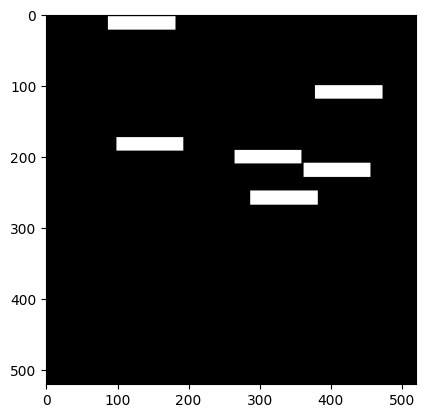

In [14]:
plt.imshow(y[0].cpu(), cmap="grey", vmax=1, vmin=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].


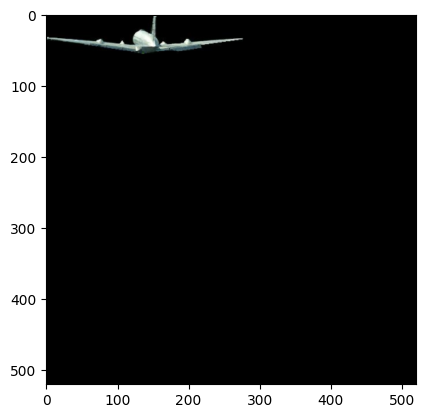

In [15]:
plt.imshow(bg.permute(1, 2, 0).cpu())

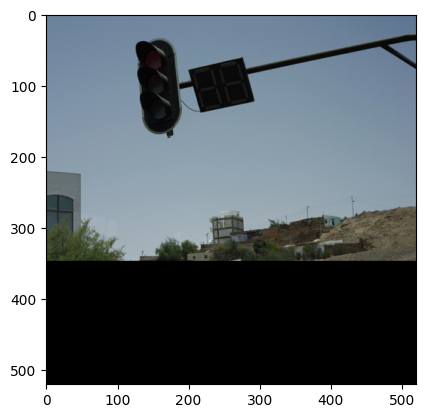

In [16]:
plt.imshow(fg.permute(1, 2, 0).cpu())

In [21]:
x.shape

torch.Size([6, 520, 520])

In [11]:
model.load_state_dict(torch.load("../../../12weight.pt", weights_only=True))
model.eval()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
 

In [12]:
model.to(gpu)

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
 

In [13]:
result_dict = {}

In [14]:
my_y = None
my_x = None
my_p = None
my_n = None
def test_loop(dataloader, model, loss_fn,result_dict, t=None):
    global my_y, my_p, my_n, my_x
    model.eval()
    batch_num = len(dataloader)
    test_loss, correct = 0, 0

    with torch.no_grad():
        for X, y,n in dataloader:
            pred = model(X)
            #print(pred["out"].shape)
            #print(torch.sum(nn.functional.softmax(pred["out"], 2)))
            #print(nn.functional.softmax(y, 2))
            test_loss += loss_fn(pred, y).item() 
            print(test_loss)
            my_y = y
            my_x = X
            my_p = pred
            my_n = n
            break
    #print(f"epoch: {t + 1}, avg test loss: {test_loss/batch_num}")
    if t is not None:
        result_dict[t]["test"] = test_loss # edit dict because we run test AFTER train in each epoch

In [15]:
def dice_loss(pred, target, smooth=1):
    """
    Computes the Dice Loss for binary segmentation.
    https://medium.com/data-scientists-diary/implementation-of-dice-loss-vision-pytorch-7eef1e438f68
    Args:
        pred: Tensor of predictions (batch_size, 1, H, W).
        target: Tensor of ground truth (batch_size, 1, H, W).
        smooth: Smoothing factor to avoid division by zero.
    Returns:
        Scalar Dice Loss.
    """
    # Apply sigmoid to convert logits to probabilities
    pred = torch.sigmoid(pred)
    
    # Calculate intersection and union
    intersection = (pred * target).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
    
    # Compute Dice Coefficient
    dice = (2. * intersection + smooth) / (union + smooth)
    
    # Return Dice Loss
    return 1 - dice.mean()

In [16]:
test_loop(train_dataloader,model,dice_loss,result_dict)

0.38935279846191406


In [17]:
my_y.shape

torch.Size([8, 1, 520, 520])

In [17]:
torch.unique(flatten(my_y[2][0]))

tensor([0.0000, 0.0039, 0.9961, 1.0000], device='cuda:0')

In [18]:
torch.unique(flatten(my_p[2][0]))

tensor([-78.0104, -77.9367, -74.7123,  ...,  38.5405,  38.6260,  38.6984],
       device='cuda:0')

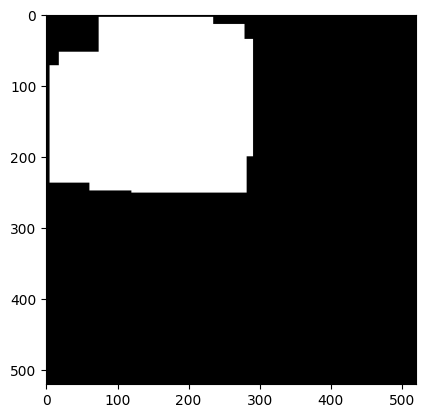

In [19]:
plt.imshow(my_y[2][0].cpu(), cmap="grey", vmin=0, vmax=1)

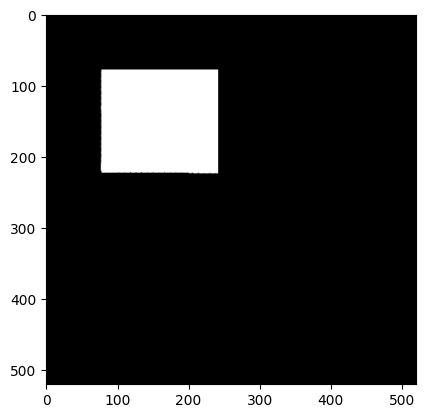

In [20]:
plt.imshow(torch.sigmoid(my_p[2][0]).cpu(), cmap="grey", vmin=0, vmax=1)

In [39]:
!ls

background	    lraspp_backup.ipynb      new_train_label.csv  train_set.csv
composite	    lraspp.ipynb	     old_label		  uniform
create_label.ipynb  max			     output		  weighted
density.ipynb	    new_alt_test_label.csv   readme.txt
foreground	    new_alt_train_label.csv  test.png
label.zip	    new_test_label.csv	     test_set.csv


In [22]:
categories = os.listdir("background/")

211850 1115517
yay
<class 'numpy.ndarray'>
202944 1072803
yay
<class 'numpy.ndarray'>
131725 1051226
yay
<class 'numpy.ndarray'>
84040 689770
yay
<class 'numpy.ndarray'>
118379 37980
yay
<class 'numpy.ndarray'>
421639 312151
yay
<class 'numpy.ndarray'>
245746 55163
yay
<class 'numpy.ndarray'>
60677 148941
yay
<class 'numpy.ndarray'>


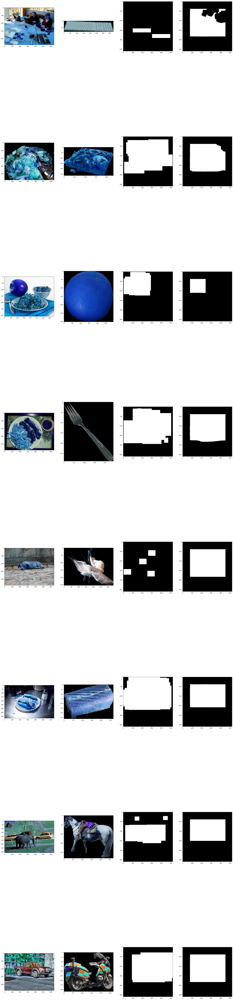

In [ ]:
# UNET dice weighted

nrow = 8
ncol = 4
plt_idx = 0
fig, axes = plt.subplots(nrow, ncol, figsize=(30,140))
for idx, p in enumerate(my_p):
    y = my_y[idx]
    example_n = my_n[idx]
    y = y[0].cpu()
    p = torch.sigmoid(p[0].cpu())
    obj, scene = example_n.split("c")
    print(scene, obj)
    for cat in categories:
        if (obj + ".jpg") in os.listdir("foreground/"+cat):
            print("yay")
            obj = cv2.imread("foreground/"+cat+"/"+obj+".jpg")
            scene = cv2.imread("background/"+cat+"/"+scene+".jpg")            
            break
    print(type(obj))
    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(scene)
    
    plt_idx +=1 
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(obj)

    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(y,cmap="grey",vmax=1,vmin=0)

    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(p,cmap="grey",vmax=1,vmin=0)


211850 1115517
yay
<class 'numpy.ndarray'>
202944 1072803
yay
<class 'numpy.ndarray'>
131725 1051226
yay
<class 'numpy.ndarray'>
84040 689770
yay
<class 'numpy.ndarray'>
118379 37980
yay
<class 'numpy.ndarray'>
421639 312151
yay
<class 'numpy.ndarray'>
245746 55163
yay
<class 'numpy.ndarray'>
60677 148941
yay
<class 'numpy.ndarray'>


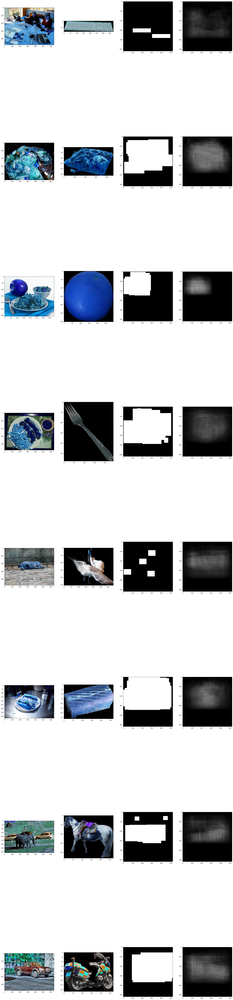

In [ ]:
# UNET MAX-dist 12epoch

nrow = 8
ncol = 4
plt_idx = 0
fig, axes = plt.subplots(nrow, ncol, figsize=(30,140))
for idx, p in enumerate(my_p):
    y = my_y[idx]
    example_n = my_n[idx]
    y = y[0].cpu()
    p = p[0].cpu()
    obj, scene = example_n.split("c")
    print(scene, obj)
    for cat in categories:
        if (obj + ".jpg") in os.listdir("foreground/"+cat):
            print("yay")
            obj = cv2.imread("foreground/"+cat+"/"+obj+".jpg")
            scene = cv2.imread("background/"+cat+"/"+scene+".jpg")            
            break
    print(type(obj))
    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(scene)
    
    plt_idx +=1 
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(obj)

    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(y,cmap="grey",vmax=1,vmin=0)

    plt_idx += 1
    plt.subplot(nrow, ncol, plt_idx)
    plt.imshow(p,cmap="grey",vmax=1,vmin=0)


In [31]:
my_p[1][0]

tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.2614],
        [0.3104, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 0.3655]],
       device='cuda:0')

In [21]:
a = torch.randn((3, 1, 2, 2))

In [37]:
a

tensor([[[[ 0.7330,  0.2577],
          [-1.0110,  0.8376]]],


        [[[ 0.0443,  1.1779],
          [-0.2721,  0.0251]]],


        [[[-0.9290,  0.4493],
          [ 1.8812,  0.3679]]]])

In [39]:
f = flatten(a, 2)

In [40]:
f

tensor([[[ 0.7330,  0.2577, -1.0110,  0.8376]],

        [[ 0.0443,  1.1779, -0.2721,  0.0251]],

        [[-0.9290,  0.4493,  1.8812,  0.3679]]])

In [42]:
f.shape

torch.Size([3, 1, 4])

In [50]:
flatten(nn.functional.softmax(f, 2),1)

tensor([[0.3440, 0.2139, 0.0601, 0.3820],
        [0.1719, 0.5341, 0.1253, 0.1687],
        [0.0396, 0.1572, 0.6582, 0.1449]])

In [ ]:
nn.functional.softmax()

In [15]:
def train_loop(dataloader, model, loss_fn, optimizer, result_dict, t=None):
    batch_num = len(dataloader)
    model.train()
    total_loss = 0
    for batch, (X, y, _) in enumerate(dataloader):
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)
        total_loss += loss.item()

        # Backpropagation
        #loss.requires_grad = True
        #loss.to(gpu)
        #print(loss)
        #print()
        loss.backward()
        """
        for each_loss in loss:
            each_loss.backward(retain_graph=True)"""
        optimizer.step()
        optimizer.zero_grad()
    print(f"epoch: {t + 1}, avg train loss: {total_loss/batch_num}")
    if t is not None:
        result_dict[t] = {"train": total_loss/batch_num} # create dict because we run train BEFORE test in each epoch

In [17]:
import json

In [40]:
result_dict = {}
lr = 0.001
optim = torch.optim.Adam(model.parameters(), lr=lr)

for t in range(10):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loop(train_dataloader, model, loss_fn, optim, result_dict, t)
    test_loop(test_dataloader, model, loss_fn, result_dict, t)
    print("-------------------------------\n")
print(("*"*100)+"\nDone!")

with open("output/trainingresult.json", "w") as f:
    json.dump(result_dict, f)
print("Training result saved to output/trainingresult.json")

Epoch 1
-------------------------------
epoch: 1, avg train loss: 0.028482012229191292
1.0556687135249376
epoch: 1, avg test loss: 0.034053829468546376
-------------------------------

Epoch 2
-------------------------------
epoch: 2, avg train loss: 0.02203884502822483
0.9240362960845232
epoch: 2, avg test loss: 0.029807622454339457
-------------------------------

Epoch 3
-------------------------------
epoch: 3, avg train loss: 0.0205893934779876
0.8858722895383835
epoch: 3, avg test loss: 0.028576525468980114
-------------------------------

Epoch 4
-------------------------------
epoch: 4, avg train loss: 0.019710025443015873
0.9277340359985828
epoch: 4, avg test loss: 0.02992690438705106
-------------------------------

Epoch 5
-------------------------------
epoch: 5, avg train loss: 0.01916047812917748
0.9804723113775253
epoch: 5, avg test loss: 0.031628139076694366
-------------------------------

Epoch 6
-------------------------------
epoch: 6, avg train loss: 0.018871095177

FileNotFoundError: [Errno 2] No such file or directory: 'output/trainingresult.json'

In [18]:
def test_loop(dataloader, model, loss_fn,result_dict, t=None):
    model.eval()
    batch_num = len(dataloader)
    test_loss, correct = 0, 0

    with torch.no_grad():
        for X, y,_ in dataloader:
            pred = model(X)
            test_loss += loss_fn(pred, y).item()    
    print(f"epoch: {t + 1}, avg test loss: {test_loss/batch_num}")
    if t is not None:
        result_dict[t]["test"] = test_loss # edit dict because we run test AFTER train in each epoch

In [44]:
def save_dist_eval(dataset, model, loss_fn, out_dir="output/"):
    # Do prediction one by one so we can save result
    model.eval()
    total_loss = 0    
    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y, n in dataset:
            pred = model(X)["out"]
            for i, x in enumerate(pred):
                fn = os.path.join(out_dir, n[i] + ".png")
                x = torch.clamp(x[0], min=0,max=1)
                img = (x * 255).cpu().numpy().astype('uint8')
                cv2.imwrite(fn, img)

In [45]:
save_dist_eval(test_dataloader,model,loss_fn)

In [24]:
pred[1]

NameError: name 'pred' is not defined